In [1]:
import os
import sys
import numpy as np
import cv2
from matplotlib import pyplot as plt
from sklearn.utils import resample

sys.path.append("../../")

from src.data import TrainValTestSplitter, MURASubset
from src import MODELS_DIR, DATA_PATH

## Possible image pipeline

In [2]:
random_seed = 42
size = 50

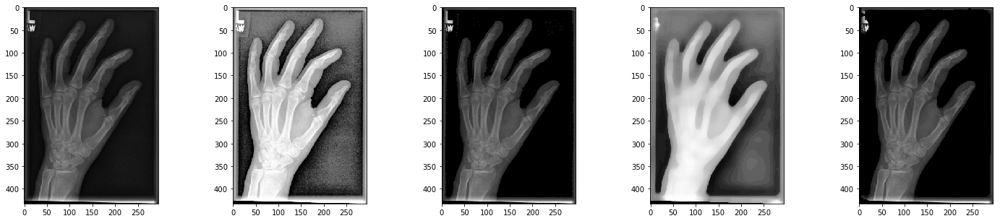

In [3]:
# load image
img = cv2.imread('../../data/train/XR_HAND_CROPPED/patient00008/study1_positive/image1.png',0)
# apply histogram equalization
img_equ = cv2.equalizeHist(img)
# get threshold based on image with histogram equalization
ret,th = cv2.threshold(img_equ,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
th[th > 0] = 1
img_mask = img * th
# apply median blur on image with histogram equalization
median = cv2.medianBlur(img_equ,19)
# get threshold based on image with histogram equalization and median filter
ret1,th1 = cv2.threshold(median,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
th1[th1 > 0] = 1
img_mask_1 = img * th1
# plot
fig, ax = plt.subplots(nrows=1, ncols=5, figsize=(25, 5))
ax[0].imshow(img, cmap='gray') 
ax[1].imshow(img_equ, cmap='gray') 
ax[2].imshow(img_mask, cmap='gray') 
ax[3].imshow(median, cmap='gray') 
ax[4].imshow(img_mask_1, cmap='gray')

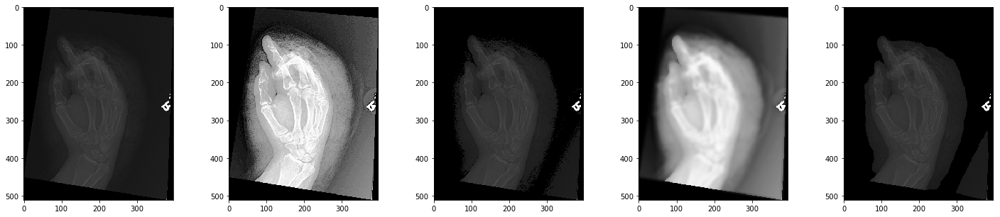

In [4]:
img = cv2.imread('../../data/train/XR_HAND_CROPPED/patient10102/study1_positive/image1.png',0)
img_equ = cv2.equalizeHist(img)

ret,th = cv2.threshold(img_equ,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
th[th > 0] = 1
img_mask = img * th

median = cv2.bilateralFilter(img_equ, 15, 80, 80)

ret1,th1 = cv2.threshold(median,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
th1[th1 > 0] = 1
img_mask_1 = img * th1

fig, ax = plt.subplots(nrows=1, ncols=5, figsize=(25, 5))
ax[0].imshow(img, cmap='gray') 
ax[1].imshow(img_equ, cmap='gray') 
ax[2].imshow(img_mask, cmap='gray') 
ax[3].imshow(median, cmap='gray') 
ax[4].imshow(img_mask_1, cmap='gray')

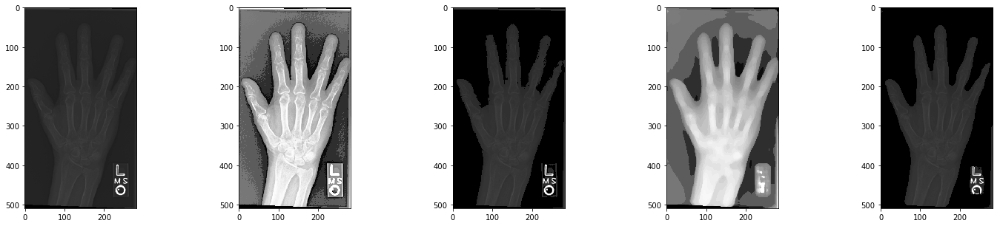

In [5]:
img = cv2.imread('../../data/train/XR_HAND_CROPPED/patient10334/study1_negative/image1.png',0)
img_equ = cv2.equalizeHist(img)

ret,th = cv2.threshold(img_equ,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
th[th > 0] = 1
img_mask = img * th

median = cv2.medianBlur(img_equ,19)

ret1,th1 = cv2.threshold(median,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
th1[th1 > 0] = 1
img_mask_1 = img * th1

fig, ax = plt.subplots(nrows=1, ncols=5, figsize=(25, 5))
ax[0].imshow(img, cmap='gray') 
ax[1].imshow(img_equ, cmap='gray') 
ax[2].imshow(img_mask, cmap='gray') 
ax[3].imshow(median, cmap='gray') 
ax[4].imshow(img_mask_1, cmap='gray')

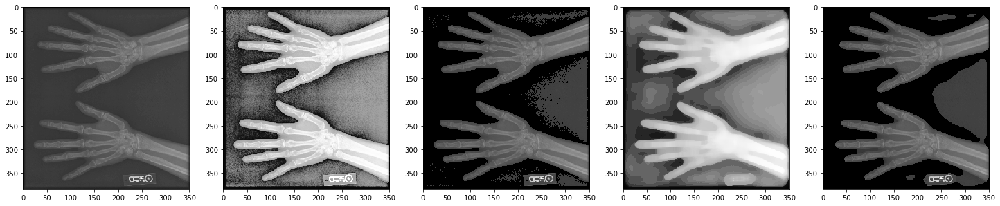

In [6]:
img = cv2.imread('../../data/train/XR_HAND_CROPPED/patient10552/study1_negative/image1.png',0)
img_equ = cv2.equalizeHist(img)

ret,th = cv2.threshold(img_equ,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
th[th > 0] = 1
img_mask = img * th

median = cv2.medianBlur(img_equ,19)

ret1,th1 = cv2.threshold(median,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
th1[th1 > 0] = 1
img_mask_1 = img * th1

fig, ax = plt.subplots(nrows=1, ncols=5, figsize=(25, 5))
ax[0].imshow(img, cmap='gray') 
ax[1].imshow(img_equ, cmap='gray') 
ax[2].imshow(img_mask, cmap='gray') 
ax[3].imshow(median, cmap='gray') 
ax[4].imshow(img_mask_1, cmap='gray')

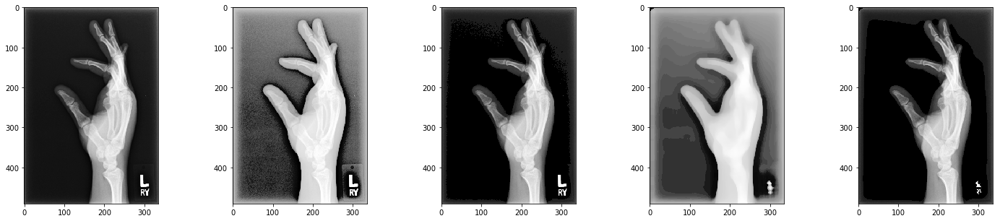

In [7]:
img = cv2.imread('../../data/train/XR_HAND_CROPPED/patient10654/study1_negative/image1.png',0)
img_equ = cv2.equalizeHist(img)

ret,th = cv2.threshold(img_equ,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
th[th > 0] = 1
img_mask = img * th

median = cv2.medianBlur(img_equ,19)

ret1,th1 = cv2.threshold(median,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
th1[th1 > 0] = 1
img_mask_1 = img * th1

fig, ax = plt.subplots(nrows=1, ncols=5, figsize=(25, 5))
ax[0].imshow(img, cmap='gray') 
ax[1].imshow(img_equ, cmap='gray') 
ax[2].imshow(img_mask, cmap='gray') 
ax[3].imshow(median, cmap='gray') 
ax[4].imshow(img_mask_1, cmap='gray')

In [8]:
def otsu_filter(data_path):
    
    path = data_path
    img = cv2.imread(path,0)
    # apply histogram equalization
    img_equ = cv2.equalizeHist(img)
    # otsu filter on images with histogram equalization
    th = cv2.threshold(img_equ,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)[1]
    th[th > 0] = 1
    img_mask = img * th
    # median filter on images with histogram equalization
    median = cv2.medianBlur(img_equ,19)
    # otsu filter on images with histogram equalization and median filter
    ret1,th1 = cv2.threshold(median,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
    th1[th1 > 0] = 1
    img_mask_1 = img * th1
    # plot images
    fig, ax = plt.subplots(nrows=1, ncols=5, figsize=(25, 5))
    ax[0].imshow(img, cmap='gray') 
    ax[0].set_title('originial')
    ax[1].imshow(img_equ, cmap='gray') 
    ax[1].set_title('histogram equalization')
    ax[2].imshow(img_mask, cmap='gray') 
    ax[2].set_title('OTSU filter')
    ax[3].imshow(median, cmap='gray') 
    ax[3].set_title('histogram equalization with median filter')
    ax[4].imshow(img_mask_1, cmap='gray')
    ax[4].set_title('OTSU filter with median filter')

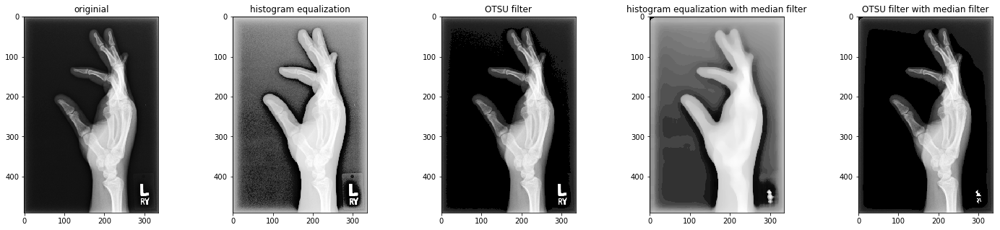

In [9]:
otsu_filter('../../data/train/XR_HAND_CROPPED/patient10654/study1_negative/image1.png')

## Apply on random images from data generator

In [10]:
run_params = {
    'pipeline': {
        'hist_equalisation': True,
        'data_source': 'XR_HAND_CROPPED',
    }
}

data_path = f'{DATA_PATH}/{run_params["pipeline"]["data_source"]}'
splitter = TrainValTestSplitter(path_to_data=data_path)
filenames = splitter.data_train.path
filenames = filenames.values

=================Train subset=================
Size: 2846
Percentage from original data: 0.5134403752480606
Percentage of negatives: 1.0
Number of patients: 1017
=============Validation subset===============
Size: 1356
Percentage from original data: 0.24463287028684827
Percentage of negatives: 0.4837758112094395
Number of patients: 473
=================Test subset=================
Size: 1341
Percentage from original data: 0.2419267544650911
Percentage of negatives: 0.4153616703952274
Number of patients: 474


In [11]:
# get subsample
indices = resample(filenames, replace=False, n_samples=size, random_state=random_seed)

## Plot images

/Users/viettran/.conda/envs/xray_1/lib/python3.7/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


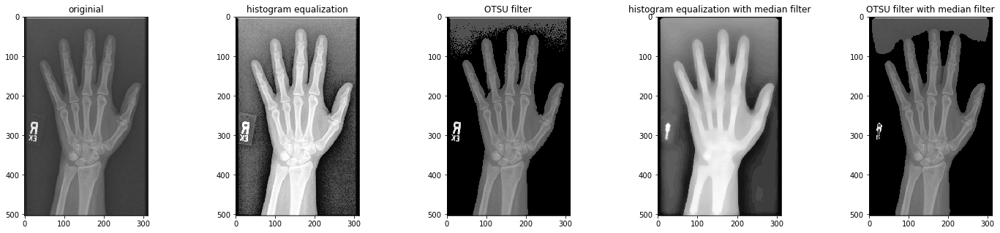

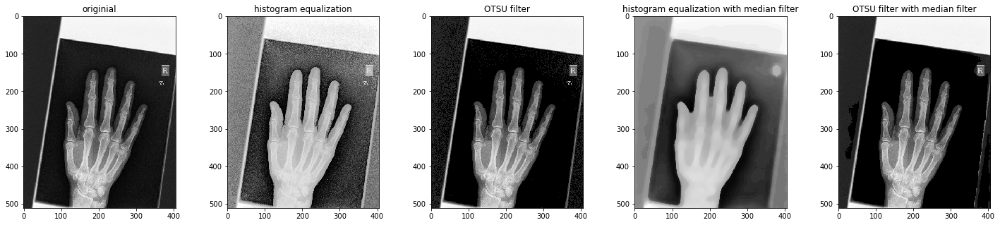

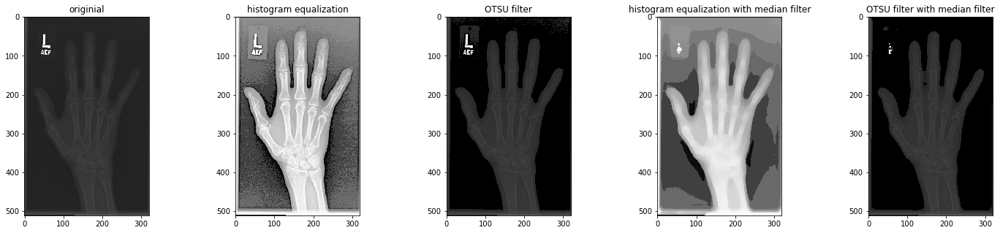

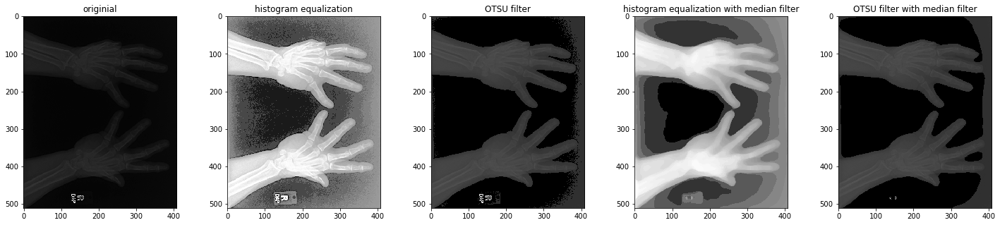

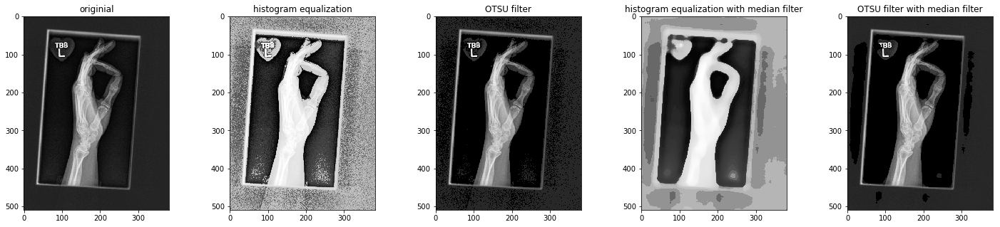

...

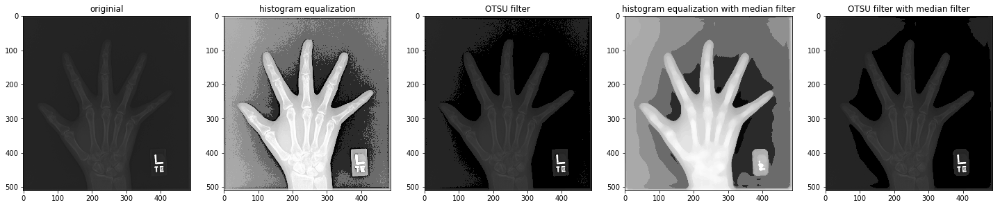

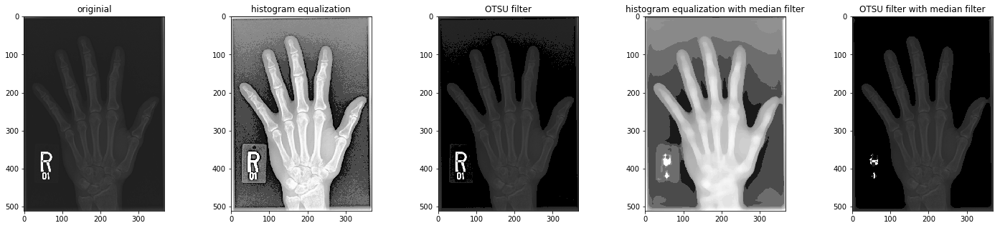

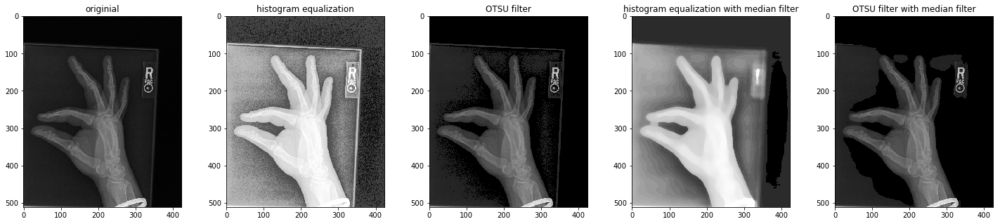

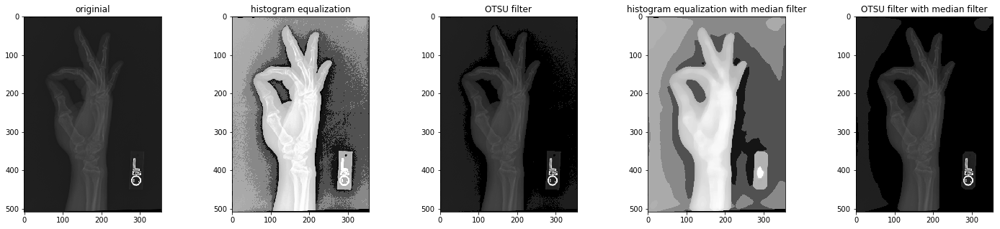

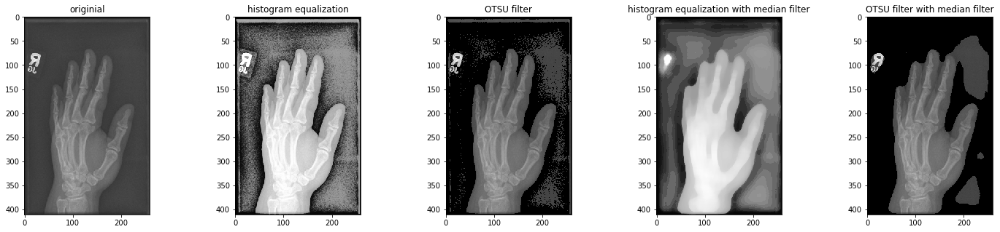

In [12]:
for i in range(size):
    otsu_filter(indices[i])

## Add Adaptive Histogram Equalization

In [13]:
clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8,8))

def otsu_filter(data_path):
    
    path = data_path
    img = cv2.imread(path,0)
    # apply histogram equalization
    img_equ = cv2.equalizeHist(img)
    # otsu filter on images with histogram equalization
    th = cv2.threshold(img_equ,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)[1]
    th[th > 0] = 1
    # apply mask on original image
    img_mask = img * th
    # apply median on images with histogram equalization
    median = cv2.medianBlur(img_equ,19)
    # otsu filter on images with histogram equalization with median filter
    ret1,th1 = cv2.threshold(median,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
    th1[th1 > 0] = 1
    # apply mask on original image
    img_mask_1 = img * th1
    # add adaptive histogram equalization
    cl = clahe.apply(img_mask_1)

    # plot
    fig, ax = plt.subplots(nrows=1, ncols=4, figsize=(25, 5))
    ax[0].imshow(img, cmap='gray') 
    ax[0].set_title('originial')
    ax[1].imshow(img_mask, cmap='gray') 
    ax[1].set_title('OTSU filter')
    ax[2].imshow(img_mask_1, cmap='gray')
    ax[2].set_title('OTSU filter with median filter')
    ax[3].imshow(cl, cmap='gray')
    ax[3].set_title('CLAHE')    

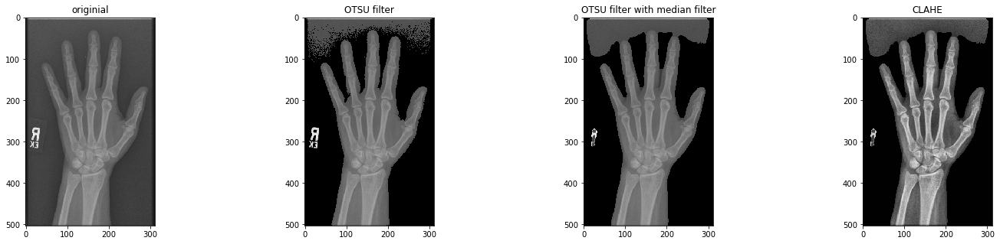

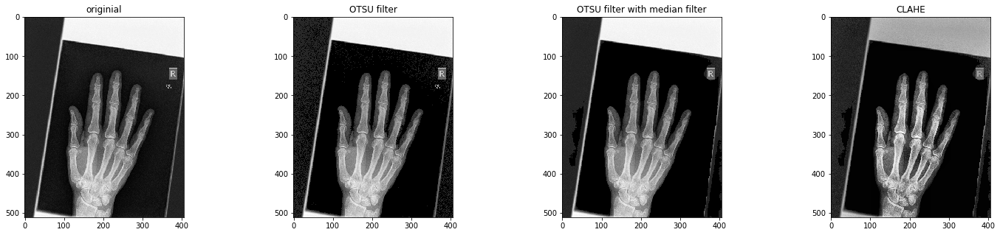

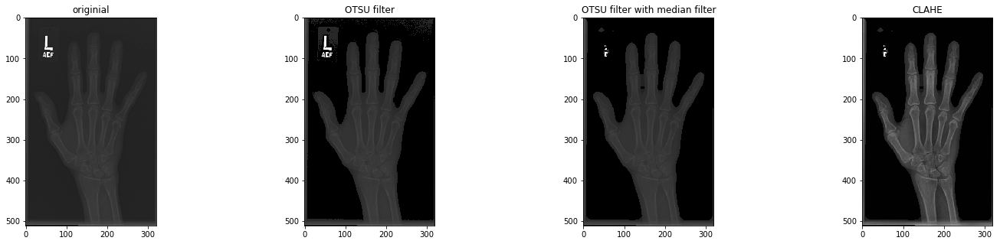

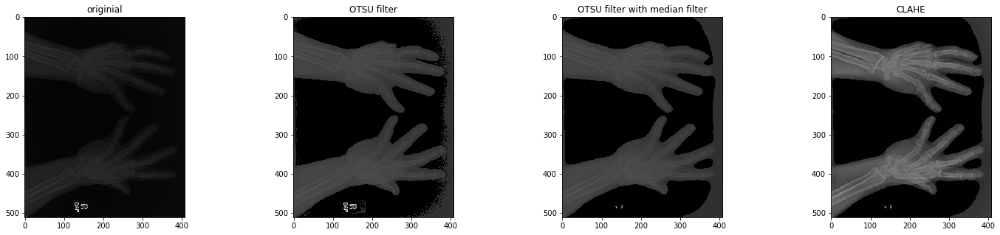

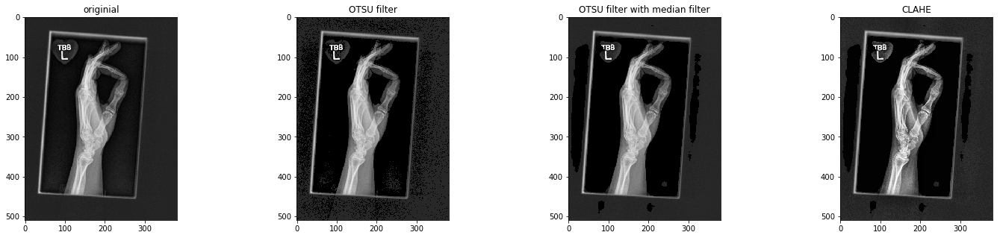

...

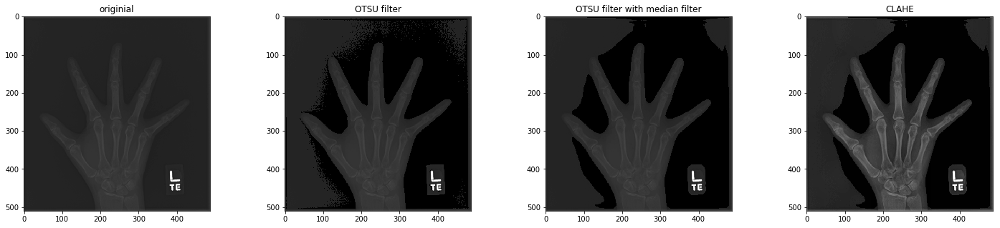

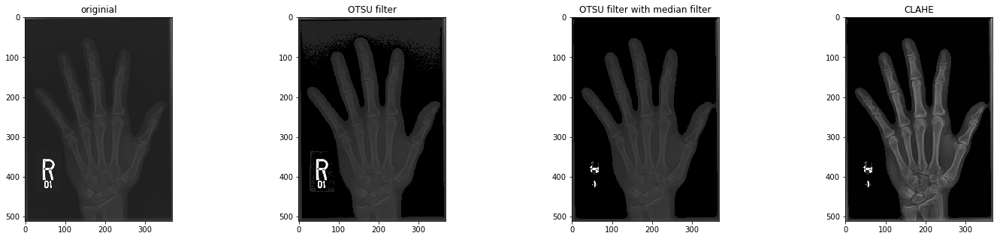

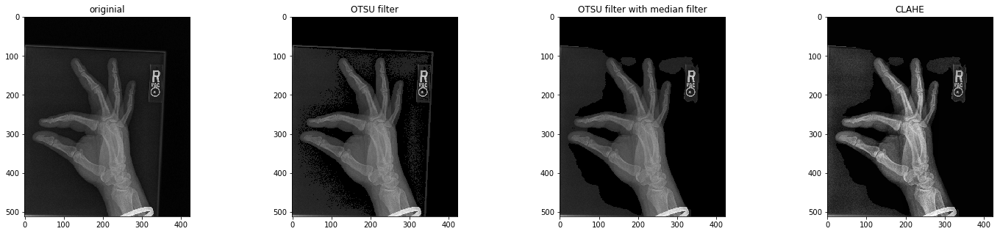

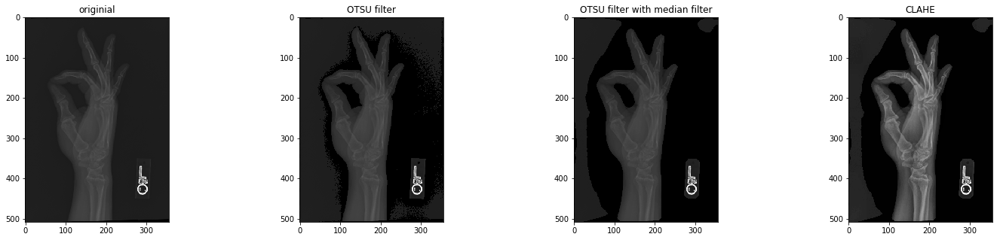

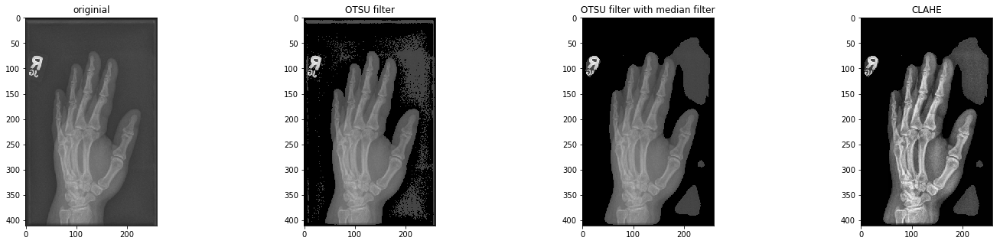

In [14]:
for i in range(size):
    otsu_filter(indices[i])